In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import contextily as cx

import torch
from models.baselines import BaseForestModel

import sys, os
from scripts.ClassRunner import Runner

import scripts.metrics as metrics

In [12]:
def prepare_shape(data):
    shape = data.shape
    if len(shape)==2:
        if shape[1] == 2:
            data = data[:, 1]
        if shape[1] == 1:
            data = data[:, 0] 
    return data

In [5]:
REG = 'sverdlovsk'

dataset_path = f'./test_data'

test_table = f'./sverdlovsk_y2018_100_160.geojson'
full_year_table = f'./sverdlovsk_y2018.geojson'

## Inference Article

Load table with reference data

In [4]:
df = gpd.read_file(test_table)
print(np.unique(df['target_day'], return_counts=True))

(array([-1,  1,  2,  3,  4,  5]), array([55130,    62,    62,    62,    62,    62]))


Plot fire reference cells

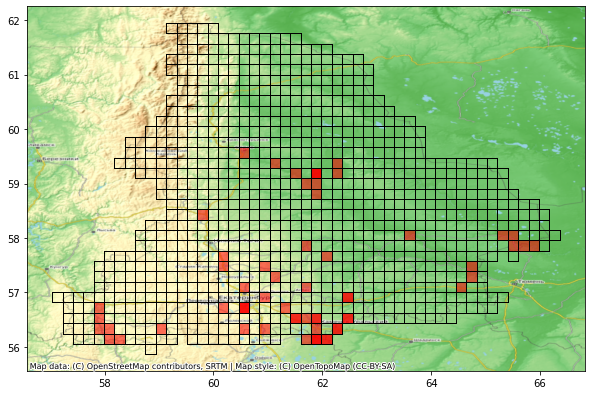

In [5]:
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
df.boundary.plot(ax=axs, color='black', linewidth=0.5)
# df[df['target_day'] < 0].plot(ax=axs, color='green', alpha=0.1, aspect=0.5)
df[df['target_day'] > 0].plot(ax=axs, color='red',alpha=0.15, aspect=0.5)
cx.add_basemap(ax=axs, crs=df.crs, source=cx.providers.OpenTopoMap)

Load model

In [5]:
runner = Runner(test_table, dataset_path)

In [9]:
path_to_checkpoint = f'weights/GradientBoosting_{REG}.pth'
path_to_loader_config = f'weights/{REG}.json'

checkpoint = torch.load(path_to_checkpoint, map_location=torch.device('cpu')) 

model = checkpoint['model']
threshold = model.threshold

In [9]:
out = runner.run_inference(model,
                           path_to_loader_config,
                           batch_size=16,
                           n_jobs=16,
                           device='cpu'
                         )

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 3465/3465 [1:50:04<00:00,  1.91s/it]


In [10]:
out['pred'] = prepare_shape(out['pred'])
out['target'] = prepare_shape(out['target'])

out['pred'].shape, out['target'].shape

(torch.Size([55440]), torch.Size([55440]))

Save predictions

In [16]:
pred_table = gpd.read_file(test_table)
pred_table['pred'] = out['pred']
pred_table['threshold'] = threshold

pred_save_name = f'{REG}_gradient_boosting'
print(pred_save_name)

pred_table.to_file(f'predictions/{pred_save_name}.geojson', driver='GeoJSON')

sverdlovsk_gradient_boosting


### Metrics

In [11]:
fire_predict = (1*out['pred']>threshold).numpy()
lables = 1*out['target'].numpy()

TP = (fire_predict * lables).sum().astype(int)
TN = ((1-fire_predict) * (1-lables)).sum().astype(int)
FP = (fire_predict * (1-lables)).sum().astype(int)
FN = ((1-fire_predict) * lables).sum().astype(int)

print(TP)
print(FN)
print(TN)
print(FP)

310
0
47056
8074


In [15]:
betas = [1, 5, 20, 100]

metric_functions= {}
for beta in betas:
    metric_functions.update({
        f"F1_b_{beta}" : metrics.BETA_F1_BINARY(beta=beta, bidirectional=True),
    })


ms = runner.run_default_metrics(out['pred'], out['target'], threshold, metric_functions) 
for m in ms:
    print(m, np.round(ms[m].numpy(), 4))

F1_b_1 0.4962
F1_b_5 0.7465
F1_b_20 0.9693
F1_b_100 0.9987


## Inference Full Year

In [10]:
path_to_checkpoint = f'weights/GradientBoosting_{REG}.pth'
path_to_loader_config = f'weights/{REG}.json'

checkpoint = torch.load(path_to_checkpoint, map_location=torch.device('cpu')) 

model = checkpoint['model']
threshold = model.threshold

In [11]:
out = runner.run_inference(model,
                           path_to_loader_config,
                           batch_size=16,
                           n_jobs=16,
                           device='cpu'
                         )

100%|█████████████████████████████████████████████████████████████████████████████████| 171/171 [01:18<00:00,  2.19it/s]


In [13]:
out['pred'] = prepare_shape(out['pred'])
out['target'] = prepare_shape(out['target'])

out['pred'].shape, out['target'].shape

(torch.Size([2726]), torch.Size([2726]))

### Metrics

In [14]:
fire_predict = (1*out['pred']>threshold).numpy()
lables = 1*out['target'].numpy()

TP = (fire_predict * lables).sum().astype(int)
TN = ((1-fire_predict) * (1-lables)).sum().astype(int)
FP = (fire_predict * (1-lables)).sum().astype(int)
FN = ((1-fire_predict) * lables).sum().astype(int)

print(TP)
print(FN)
print(TN)
print(FP)

650
0
1952
124


In [15]:
F1_fire = 2*TP / (2*TP + FN + FP)
F1_no_fire = 2*TN / (2*TN + FN + FP)

print(f'F1_fire: {np.round(F1_fire, 4)} F1_no_fire: {np.round(F1_no_fire, 4)}')

F1_fire: 0.9129 F1_no_fire: 0.9692


## Visualize

In [41]:
df = gpd.read_file(f'predictions/{REG}_gradient_boosting.geojson')
len(df)

55440

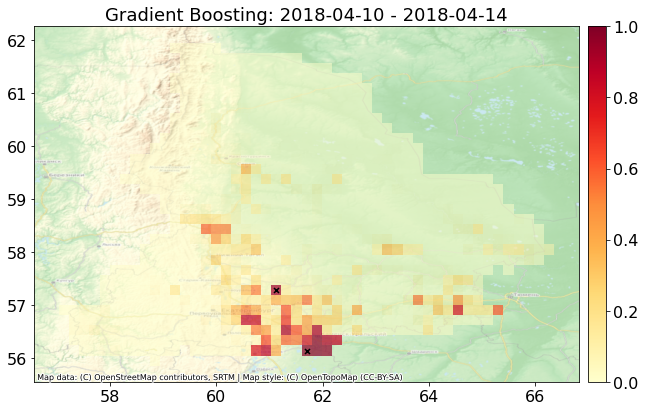

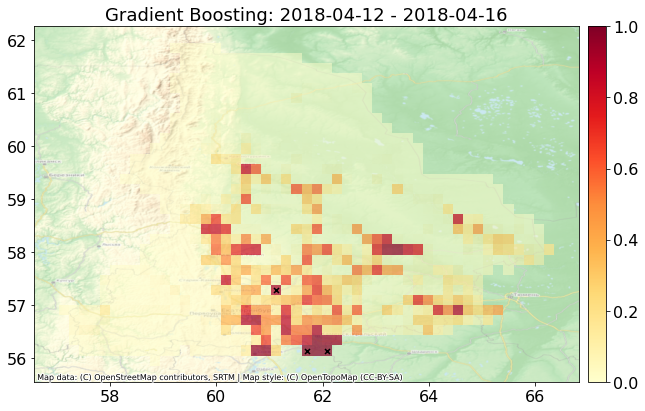

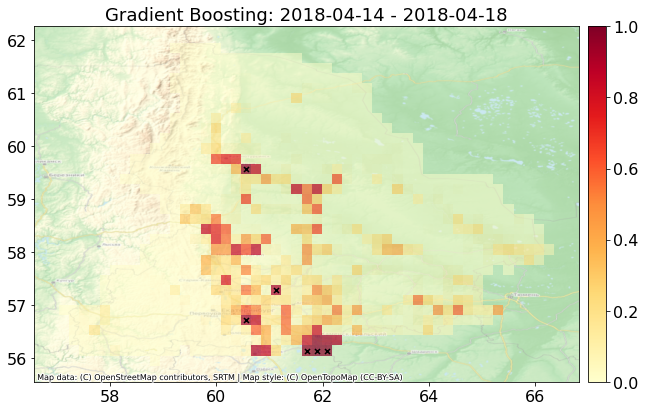

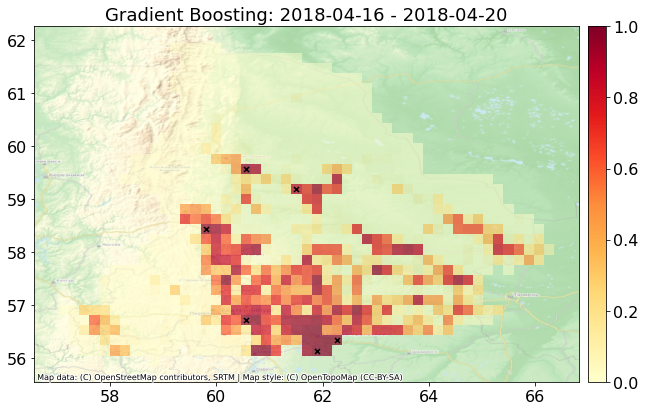

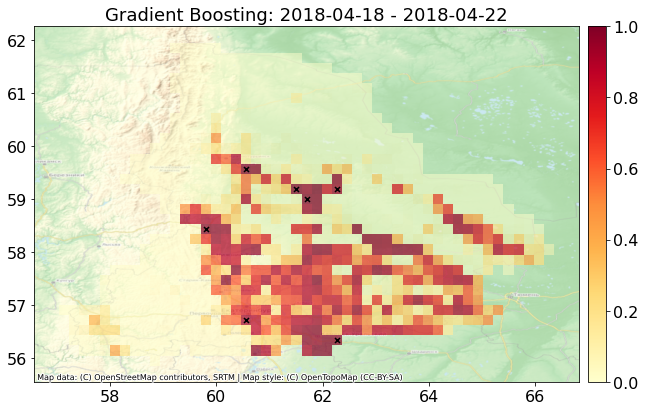

...

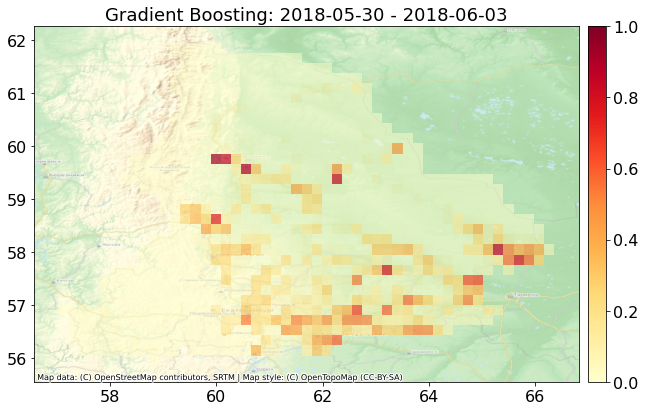

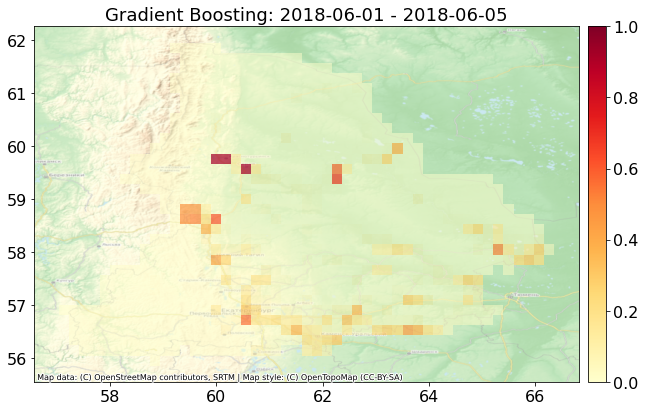

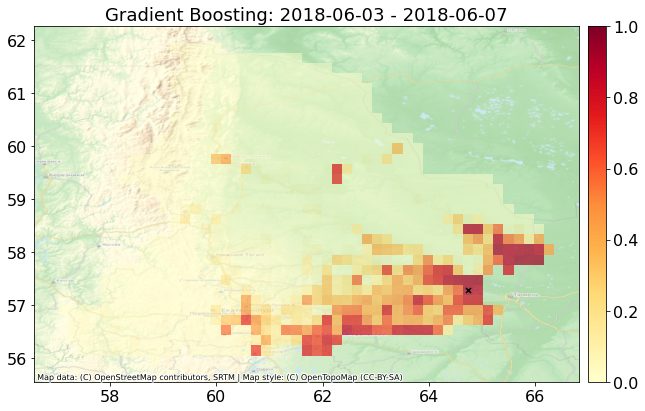

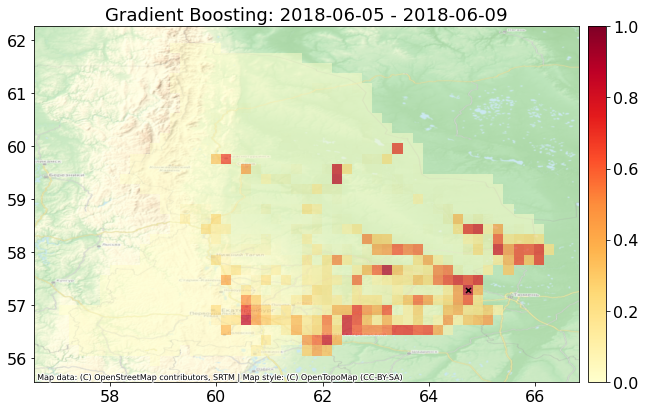

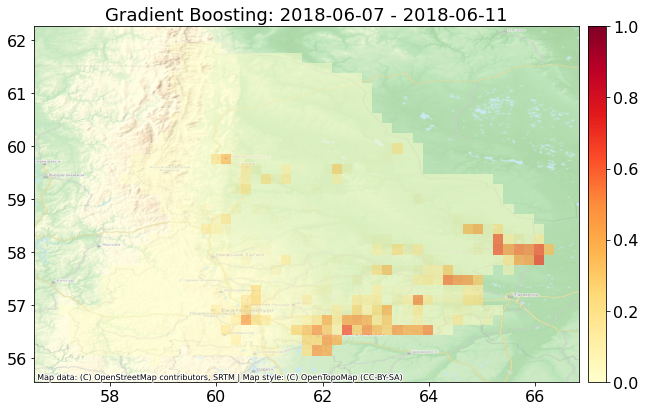

In [40]:
pd.options.mode.chained_assignment = None  # default='warn'

path_out = f'imgs'
os.makedirs(path_out, exist_ok=True)

date = df['target_date'].min()
t = pd.Timestamp(date)
start_day = t.day_of_year

plt.rcParams.update({'font.size': 16})

tdays = np.arange(0, len(df['target_date'].unique()), 2)
for i in tdays:
    fig, axs = plt.subplots(1, 1, figsize=(14, 6))

    day2plot = t + pd.DateOffset(days=int(i))
    to_plot = df[df['target_date'] == day2plot]
    to_plot[to_plot['pred'] <= 0.1].plot(ax=axs, column='pred', cmap='YlOrRd', alpha=0.5, vmax=1, vmin=0.0)
    to_plot[to_plot['pred'] > 0.1].plot(ax=axs, column='pred', cmap='YlOrRd', linewidth=0.5,
                         legend=True, alpha=0.7, aspect=1, vmax=1, vmin=0.0,
                         legend_kwds={'pad': 0.01})
    
    # plot targets
    gt = to_plot[to_plot.target_day > 0]
    gt.loc[:, 'geometry'] = gt.to_crs('+proj=cea').centroid.to_crs(gt.crs)
    if len(gt)>0:
        gt.plot(ax=axs, color='black', markersize=25, marker="x",
                        legend=True, alpha=1, aspect=1)
    
    # add title and tile map
    end_day = t + pd.DateOffset(days=int(i+4))
    axs.set_title(f"Gradient Boosting: {day2plot.strftime('%Y-%m-%d')} - {end_day.strftime('%Y-%m-%d')}", fontsize=18)
    cx.add_basemap(ax=axs, crs=df.crs, source=cx.providers.OpenTopoMap, alpha=0.5)
    fig.tight_layout()
    plt.show()
    fig.savefig(f'{path_out}/d{(start_day + int(i)):03d}.png', dpi=fig.dpi, bbox_inches='tight')